### Libraries

In [12]:
from PIL import Image
import numpy as np
import argparse, json
from collections import Counter
from tqdm.auto import tqdm
from pathlib import Path
import pickle
from nltk.tokenize import RegexpTokenizer
import torch
import torch.nn as nn
from torchvision.models import vgg19
import torch.optim as optim
from torch.utils.data import Dataset
from torch.autograd import Variable
from torchvision import transforms
from torch.nn.utils.rnn import pack_padded_sequence
from nltk.translate.bleu_score import corpus_bleu
from nltk.translate import meteor_score
import random
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import skimage
import skimage.transform
import torchvision.transforms as transforms
from math import ceil



In [3]:
base_dir = Path("/kaggle/input/ass4q1/Data/")
# base_dir = Path("./")


# Model

In [18]:
class show_attend_tell(nn.Module):
    def __init__(self,vocabulary_size,encoder_dim,fine_tune_vgg = True,debug = False):
        super(show_attend_tell, self).__init__()

        self.debug = debug

        #layer for vgg encoder
        self.vgg = vgg19(pretrained=True)
        self.vgg = nn.Sequential(*list(self.vgg.features.children())[:-1])
        for p in self.vgg.parameters():
            p.requires_grad = False

        for c in list(self.vgg.children())[7:]:
            for p in c.parameters():
                p.requires_grad = fine_tune_vgg
        
        #layers for attention
        self.U = nn.Linear(512, 512)
        self.W = nn.Linear(encoder_dim, 512)
        self.v = nn.Linear(512, 1)
        self.tanh = nn.Tanh()
        self.softmax = nn.Softmax(1)

        #layers for decoder
        self.vocabulary_size = vocabulary_size
        self.encoder_dim = encoder_dim

        self.init_h = nn.Linear(encoder_dim, 512)
        self.init_c = nn.Linear(encoder_dim, 512)
        self.tanh = nn.Tanh()

        self.f_beta = nn.Linear(512, encoder_dim)
        self.sigmoid = nn.Sigmoid()

        self.deep_output = nn.Linear(512, vocabulary_size)
        self.dropout = nn.Dropout()

        self.embedding = nn.Embedding(vocabulary_size, 512)
        self.lstm = nn.LSTMCell(512 + encoder_dim, 512)


    def run_vgg(self, x):
        x = self.vgg(x)
        x = x.permute(0, 2, 3, 1)
        x = x.view(x.size(0), -1, x.size(-1))
        return x


    def run_attention(self, img_features, hidden_state):
        """
        INPUT : 
            img_features : (batch_size,14*14,512)
            hidden_state : (batch_size,512)
        RETURNS :
            context : (batch_size,512)
            alpha : (batch,196)
        """
        U_h = self.U(hidden_state).unsqueeze(1) # (batch_size,1,512)
        W_s = self.W(img_features) # (batch_size,14*14,512)
        att = self.tanh(W_s + U_h) # (batch_size,14*14,512)
        e = self.v(att).squeeze(2) # (batch_size,14*14)
        alpha = self.softmax(e) # (batch_size,14*14)
        context = (img_features * alpha.unsqueeze(2)).sum(1)

        if self.debug:
            print(f"U_h = {U_h.shape} W_s = {W_s.shape} att = {att.shape} e = {e.shape} alpha = {alpha.shape} context = {context.shape}")
            #U_h = torch.Size([12, 1, 512]) W_s = torch.Size([12, 196, 512]) att = torch.Size([12, 196, 512]) e = torch.Size([12, 196]) alpha = torch.Size([12, 196]) context = torch.Size([12, 512])

        return context, alpha

    def forward(self, img_features, max_timespan):
        """
            img_features : (batch_size, 3, 224, 224)
            captions : int
        """
        if self.debug:
            print(f"img_features input = {img_features.shape}")

        img_features = self.run_vgg(img_features) #(batch_size,14*14,512)
        batch_size = img_features.size(0)

        h, c = self.get_init_lstm_state(img_features) #h,c -> (batch_size,512)

        prev_words = torch.zeros(batch_size, 1).long().cuda() #prev_words starting from <start> token for every sample in batch 

        
        embedding = self.embedding(prev_words) # (batch_size,1,512)
        if self.debug:
            print(f"embedding = {embedding.shape}")

        preds = torch.zeros(batch_size, max_timespan, self.vocabulary_size).cuda()  
        alphas = torch.zeros(batch_size, max_timespan, img_features.size(1)).cuda() # alphas = torch.Size([batch_size, 38, 14*14])

        if self.debug:
            print(f"preds = {preds.shape} alphas = {alphas.shape}")
        
        for t in range(max_timespan):
            context, alpha = self.run_attention(img_features, h) # context : (batch_size,512) & alpha : (batch,196)
            gate = self.sigmoid(self.f_beta(h)) # gate : (batch_size,512) We compute the weights and attention-weighted encoding at each timestep with the Attention network. In section 4.2.1 of the paper, they recommend passing the attention-weighted encoding through a filter or gate. This gate is a sigmoid activated linear transform of the Decoder's previous hidden state. The authors state that this helps the Attention network put more emphasis on the objects in the image.

            gated_context = gate * context # gated_context : (batch_size,512)
            if self.debug :
                print(f"gate = {gate.shape} gated_context = {gated_context.shape}")

            
            embedding = embedding.squeeze(1) if embedding.dim() == 3 else embedding
            if self.debug : 
                print(f"embedding = {embedding.shape}")
            lstm_input = torch.cat((embedding, gated_context), dim=1)

            h, c = self.lstm(lstm_input, (h, c))
            output = self.deep_output(self.dropout(h)) # (batch_size,vocab_size)
            if self.debug:
                print(f"output = {output.shape}")

            preds[:, t] = output
            alphas[:, t] = alpha

            
            temp = output.max(1)[1]
            if self.debug:
                print(f"temp = {temp}")
            embedding = self.embedding(temp.reshape(batch_size, 1))
        return preds, alphas

    def get_init_lstm_state(self, img_features):
        """
            img_features : (batch_size,14*14,512)
        """

        avg_features = img_features.mean(dim=1) # (batch_size,512)
        if self.debug:
            print(f"avg_features = {avg_features.shape}")
        
        c = self.init_c(avg_features)
        c = self.tanh(c) #check in paper once

        h = self.init_h(avg_features)
        h = self.tanh(h) #check in paper once

        if self.debug:
            print(f"c = {c.shape} h = {h.shape}")
        return h, c



class AverageMeter(object):
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

def calculate_caption_lengths(word_dict, captions):
    lengths = 0
    for caption_tokens in captions:
        for token in caption_tokens:
            if token in (word_dict['<start>'], word_dict['<eos>'], word_dict['<pad>']):
                continue
            else:
                lengths += 1
    return lengths





        

# Training

In [19]:

# vocabulary_size = len(word_dict)
# debug = False
# lr=1e-4
# alpha_c = 2
# log_interval = 10
# epochs = 100

In [ ]:
# gpu = torch.device('cuda')
# model = show_attend_tell(vocabulary_size, 512, True,debug)
# model = model.to(gpu)

# # optimizer = optim.Adam(model.parameters(), lr=lr)
# optimizer = optim.Adam(params=filter(lambda p: p.requires_grad, model.parameters()),lr=lr)

# scheduler = optim.lr_scheduler.StepLR(optimizer, 5)
# cross_entropy_loss = nn.CrossEntropyLoss().to(gpu)


In [7]:

data_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

train_loader = torch.utils.data.DataLoader(
        ImageCaptionDataset(train_img_paths,train_captions, data_transforms),
        batch_size=64, shuffle=True, num_workers=1)

val_loader = torch.utils.data.DataLoader(
        ImageCaptionDataset(validation_img_paths,validation_captions, data_transforms),
        batch_size=64, shuffle=True, num_workers=1)

test_loader = torch.utils.data.DataLoader(
        ImageCaptionDataset(test_img_paths,test_captions, data_transforms),
        batch_size=64, shuffle=True, num_workers=1)



In [22]:
gpu = torch.device('cuda')
def get_scores(model,loader):
    model.eval()
    references = []
    hypotheses = []
    for batch_idx, (imgs, captions,all_captions) in tqdm(enumerate(loader)):
        imgs, captions = Variable(imgs).to(gpu), Variable(captions).to(gpu)
        max_timespan = max([len(caption) for caption in captions]) - 1 # -1, because assuming ke model already generated start token 
        preds, alphas = model(imgs, max_timespan) 
        
        for cap_set in all_captions.tolist():
            caps = []
            for caption in cap_set:
                cap = [word_idx for word_idx in caption
                                if word_idx != word_dict['<start>'] and word_idx != word_dict['<pad>']]
                caps.append(cap)
            references.append(caps)

        word_idxs = torch.max(preds, dim=2)[1]
        for idxs in word_idxs.tolist():
            hypotheses.append([idx for idx in idxs
                                   if idx != word_dict['<start>'] and idx != word_dict['<pad>']])
        
        
    bleu_1 = corpus_bleu(references, hypotheses, weights=(1, 0, 0, 0))
    bleu_2 = corpus_bleu(references, hypotheses, weights=(0.5, 0.5, 0, 0))
    bleu_3 = corpus_bleu(references, hypotheses, weights=(0.33, 0.33, 0.33, 0))
    bleu_4 = corpus_bleu(references, hypotheses)
    score = []
    for i in range(len(references)):
        references_i = []
        for j in references[i]:
            words = []
            for k in j:
                words.append(idx_dict[k])
            references_i.append(' '.join(words))
        hypo_i = []
        for j in hypotheses[i]:
            hypo_i.append(idx_dict[j])
        score.append(meteor_score.meteor_score(references_i,' '.join(hypo_i)))
    return (bleu_1,bleu_2,bleu_3,bleu_4,np.mean(score))

In [ ]:

for epoch in range(1, 1 + epochs):
    scheduler.step()
    model.train()
    losses = AverageMeter()
    top1 = AverageMeter()
    top5 = AverageMeter()
    
    
    for batch_idx, (imgs, captions,all_captions) in enumerate(train_loader):
        imgs, captions = Variable(imgs).to(gpu), Variable(captions).to(gpu) # captions = (batch_size, max_len)
        if debug:
            print(f"imgs = {imgs.shape} captions = {captions.shape}")       
        
        optimizer.zero_grad()
        max_timespan = max([len(caption) for caption in captions]) - 1 # -1, because assuming ke model already generated start token 
        preds, alphas = model(imgs, max_timespan) 
        
        if debug:
            print(f"preds = {preds.shape} alphas = {alphas.shape}")
       
        targets = captions[:, 1:] # removing the start token 

        targets = pack_padded_sequence(targets, [len(tar) - 1 for tar in targets], batch_first=True)[0]
        packed_preds = pack_padded_sequence(preds, [len(pred) - 1 for pred in preds], batch_first=True)[0]

        att_regularization = alpha_c * ((1 - alphas.sum(1))**2).mean()

        loss = cross_entropy_loss(packed_preds, targets)
        loss += att_regularization
        loss.backward()
        optimizer.step()

        total_caption_length = calculate_caption_lengths(word_dict, captions)
        losses.update(loss.item(), total_caption_length)
        if batch_idx % log_interval == 0:
            print('Train Batch: [{0}/{1}]\t'
                  'Loss {loss.val:.4f} ({loss.avg:.4f})\t'.format(
                      batch_idx, len(train_loader), loss=losses))
    
    # x = get_scores(model,train_loader)
    y = get_scores(model,val_loader)
    z = get_scores(model,test_loader)
    
    print(f"epoch = {epoch} Val : {y} Test : {z}")


### Saving Trained Model

In [ ]:
torch.save({'model' : model.state_dict(), 'losses' : losses, 'optimizer' : optimizer, 'loss' : loss, 'epoch' : epoch,'lr':lr, 'alpha_c':alpha_c }, "best_till_now2.pth")

In [20]:
checkpoint = torch.load("/kaggle/input/ass4q1/ass4/ass4/best_till_now2/best_till_now2.pth")
model = show_attend_tell(len(word_dict), 512, True,False)



In [21]:
model.load_state_dict(checkpoint['model'])

<All keys matched successfully>

In [23]:
model = model.to(gpu)
x = get_scores(model,train_loader)
y = get_scores(model,val_loader)
z = get_scores(model,test_loader)
print(x,y,z,sep="\n")

0it [00:00, ?it/s]

0it [00:00, ?it/s]

0it [00:00, ?it/s]

(0.5194927734767907, 0.26979605492126624, 0.14354300158060235, 0.07298272279071494, 0.1924254070107408)
(0.4952205412966102, 0.24235101840782428, 0.121616186918531, 0.061446835080305434, 0.17764161884640672)
(0.5003821419128656, 0.2534263390820856, 0.13231816006842428, 0.06799633859148715, 0.18441606163133048)


In [24]:
!ls /kaggle/input/ass4q1/Data/Data/Test/Images/ | head

1056338697_4f7d7ce270.jpg
106490881_5a2dd9b7bd.jpg
1082379191_ec1e53f996.jpg
1084040636_97d9633581.jpg
1096395242_fc69f0ae5a.jpg
1107246521_d16a476380.jpg
1119015538_e8e796281e.jpg
1122944218_8eb3607403.jpg
1131800850_89c7ffd477.jpg
1131932671_c8d17751b3.jpg
ls: write error: Broken pipe


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:39: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


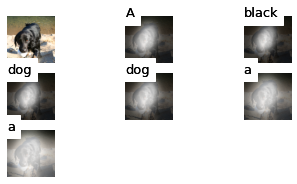

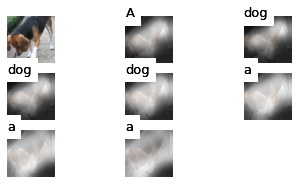

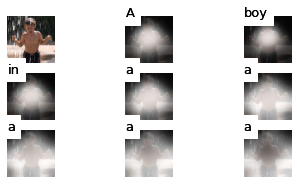

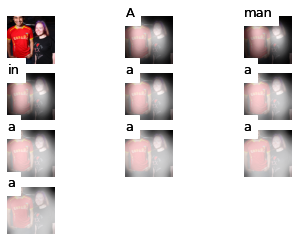

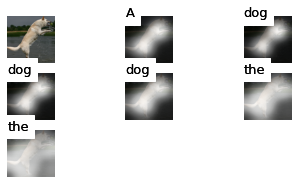

...

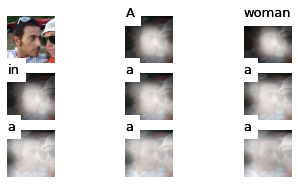

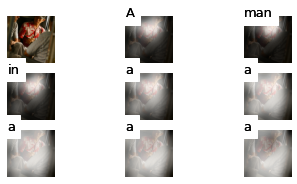

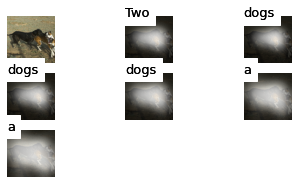

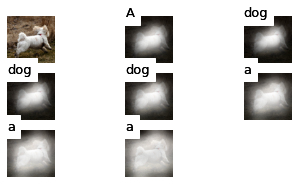

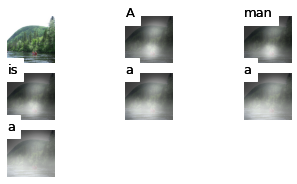

KeyboardInterrupt: 

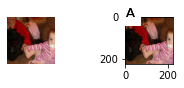

In [57]:
for img_path in Path("/kaggle/input/ass4q1/Data/Data/Test/Images/").glob("*.jpg"):
    with open(img_path, 'rb') as f:
        img = Image.open(f).convert('RGB')

    img = data_transforms(img)
    img = torch.FloatTensor(img)
    img = img.unsqueeze(0)

    model = model.to(gpu)
    model.eval()
    preds, alphas = model(img.to(gpu), 15) 
    packed_preds = pack_padded_sequence(preds, [len(pred) - 1 for pred in preds], batch_first=True)[0]
    sentence_tokens = []
    word_idxs = torch.max(preds, dim=2)[1]
    for idxs in word_idxs.tolist():
        for idx in idxs:
            if idx == word_dict['<eos>']:
                break
            if idx != word_dict['<start>'] and idx != word_dict['<pad>']:
                sentence_tokens.append(idx_dict[idx]) 

    img = Image.open(img_path)
    w, h = img.size
    if w > h:
        w = w * 256 / h
        h = 256
    else:
        h = h * 256 / w
        w = 256
    left = (w - 224) / 2
    top = (h - 224) / 2
    resized_img = img.resize((int(w), int(h)), Image.BICUBIC).crop((left, top, left + 224, top + 224))
    img = np.array(resized_img.convert('RGB').getdata()).reshape(224, 224, 3)
    img = img.astype('float32') / 255

    num_words = len(sentence_tokens)
    w = np.round(np.sqrt(num_words))
    h = np.ceil(np.float32(num_words) / w)
    alpha = torch.tensor(alphas)

    plot_height = ceil((num_words + 3) / 4.0)
    plt.figure()
    ax1 = plt.subplot(4, plot_height, 1)
    plt.imshow(img)
    plt.axis('off')
    for idx in range(num_words):
        ax2 = plt.subplot(4, plot_height, idx + 2)
        label = sentence_tokens[idx]
        plt.text(0, 1, label, backgroundcolor='white', fontsize=13)
        plt.text(0, 1, label, color='black', fontsize=13)
        plt.imshow(img)    
        shape_size = 14
        alpha_img = skimage.transform.pyramid_expand(alpha[0,idx,:].cpu().reshape(shape_size, shape_size), upscale=16, sigma=20)
        plt.imshow(alpha_img, alpha=0.8)
        plt.set_cmap(cm.Greys_r)
        plt.axis('off')
    plt.show()
